## Introduction 

Some basic Definitions 

* The entity to which the recommendation is provided is referred to as the user. 
* The product being recommended is an item.

Collaborative filtering: 

   * Uses two kinds of data : User-Item interactions such as ratings (a user (you) provides ratings about a movie (item));
   * Collaborative filtering models use the collaborative power of established user-item interactions to make recommendations about new user-item interactions.

## 0: Importing Libraries

In [1]:
import numpy as np
import pandas as pd
from tqdm import tqdm

from surprise import Reader, Dataset, accuracy
from surprise.prediction_algorithms.knns import KNNWithMeans
from surprise.model_selection import cross_validate, KFold, train_test_split
from sklearn.metrics import roc_curve, auc, mean_squared_error
from surprise.prediction_algorithms.matrix_factorization import NMF, SVD

# for plots
import os
os.environ['PATH'] = os.environ['PATH'] + ':/Library/TeX/texbin'
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
plt.style.use('science.mplstyle')
plt.rcParams['text.usetex'] = True
plt.rcParams['font.family'] = 'Times New Roman'

## Question 1

In [ ]:
# Load data 

df_ratings = pd.read_csv("./Synthetic_Movie_Lens/ratings.csv", usecols=["userId", "movieId", "rating"])
df_movies = pd.read_csv("./Synthetic_Movie_Lens/movies.csv")

In [ ]:
# Total number of possible ratings 
unique_users = df_ratings["userId"].unique()
unique_movies = df_movies["movieId"].unique()

possible_ratings = len(unique_movies)*len(unique_users)


# Total available ratings 
available_ratings = len(df_ratings["rating"])

# Sparsity 

sparsity = available_ratings/possible_ratings

print("Sparsity is {}".format(sparsity))

Sparsity is 0.016968273253211548


In [ ]:
u, indices = np.unique(ratings_matrix, return_inverse=True)

In [ ]:
u

array([0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5, 5. , nan])

In [ ]:
# Make the ratings matrix 

ratings_matrix = np.zeros(shape = (len(unique_users), len(unique_movies)))

In [ ]:
for user_id in unique_users:

    for idx, row in df_ratings[df_ratings["userId"] == user_id].iterrows():
        movie_id = int(row["movieId"])
        movie_idx = df_movies[df_movies["movieId"] == movie_id].index[0]
        rating = row["rating"]
        
        ratings_matrix[user_id-1][movie_idx] = rating
        
        

In [ ]:
values, counts = np.unique(ratings_matrix, return_counts=True)
values = values[1:]
counts = counts[1:]

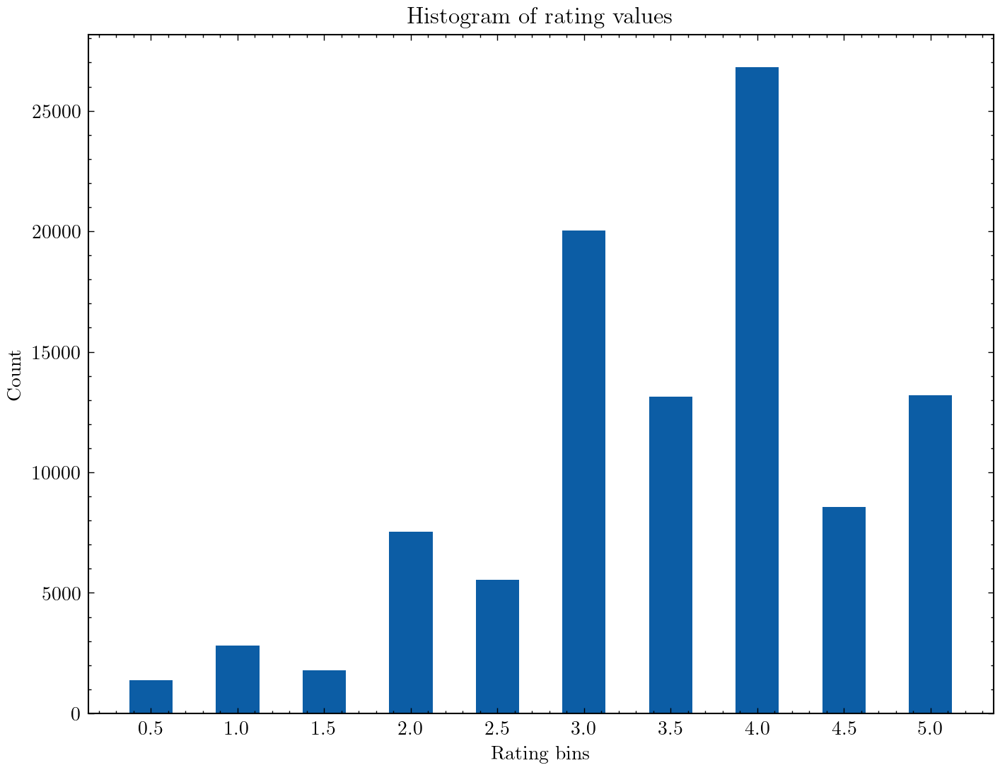

In [ ]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(values,counts, width=0.25)
ax.set_xticks(values)

plt.title('Histogram of rating values')
plt.xlabel('Rating bins')
plt.ylabel('Count')

plt.savefig("Q1_2.pdf", dpi=500, bbox_inches='tight')

plt.show()

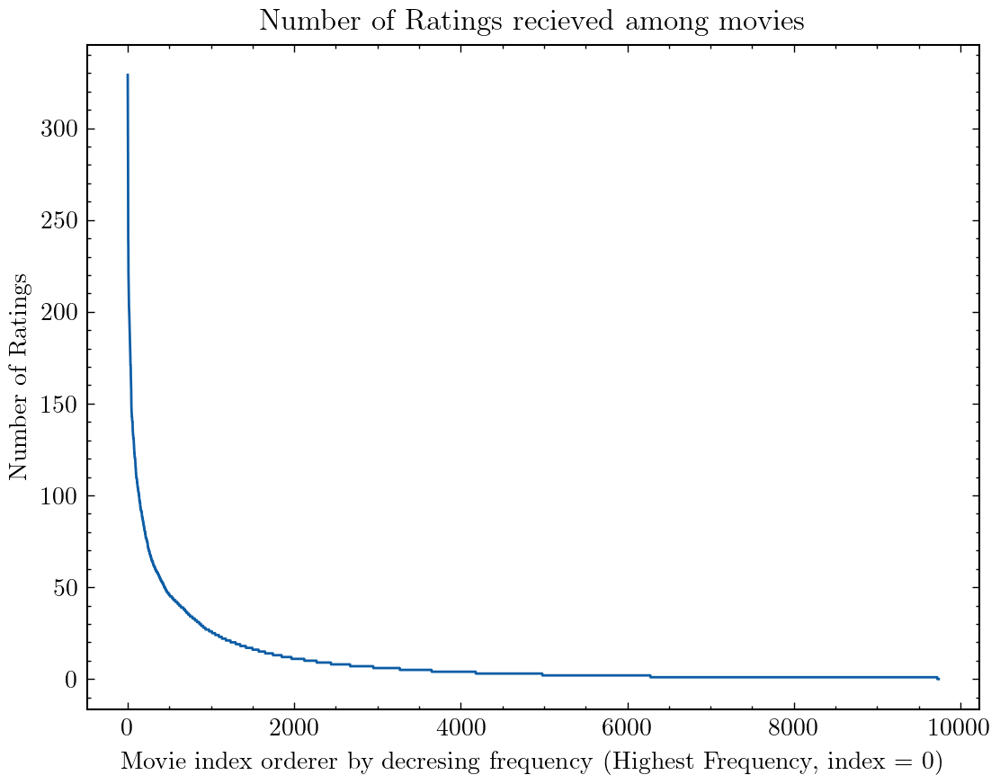

In [ ]:
# 1C 

sorted_movie_ratings = df_ratings_matrix.count().sort_values(ascending = False, ignore_index = True)

fig = sorted_movie_ratings.plot(title="Number of Ratings recieved among movies", xlabel = "Movie index orderer by decresing frequency (Highest Frequency, index = 0)", ylabel = "Number of Ratings")
fig.figure.savefig("Q1_3.pdf", dpi=500, bbox_inches='tight')

In [ ]:
fig.figure.savefig("Q1_3.pdf", dpi=500, bbox_inches='tight')

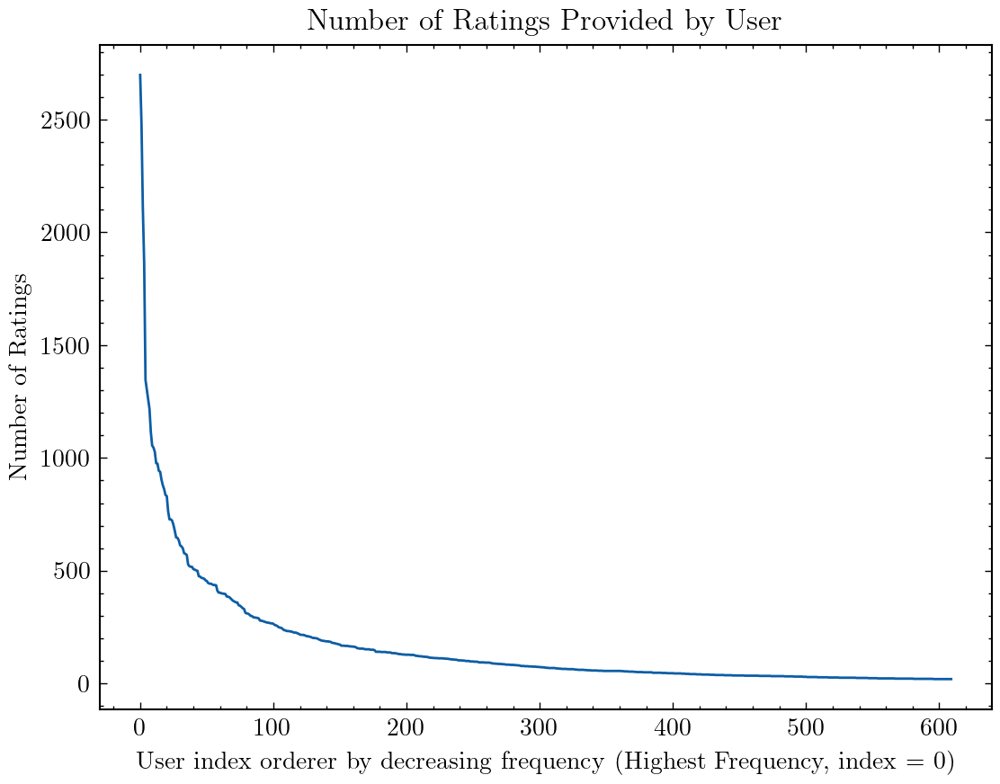

In [ ]:
# Q1d

# 1C 

sorted_movie_ratings = df_ratings_matrix.count(axis="columns").sort_values(ascending = False, ignore_index = True)

fig = sorted_movie_ratings.plot(title="Number of Ratings Provided by User", xlabel = "User index orderer by decreasing frequency (Highest Frequency, index = 0)", ylabel = "Number of Ratings")
fig.figure.savefig("Q1_4.pdf", dpi=500, bbox_inches='tight')

In [ ]:
ratings_matrix[ratings_matrix == 0] = np.nan

In [ ]:
# Q1f 

variance_series = df_ratings_matrix.var()
min_var = 0
max_var = 6

bins = [i/2 for i in range(int(min_var), 2*int(max_var))]

In [ ]:
vals = dict.fromkeys(bins, 0)

In [ ]:
for idx in range(ratings_matrix.shape[1]):
    
    var = np.nanvar(ratings_matrix[:, idx])
    
    if not math.isnan(var):
        
        
        var = round(var*2)/2

        vals[var]+=1 
        

/var/folders/rt/cz01pnk54lsf_lv342qgjmgc0000gn/T/ipykernel_2583/1128401685.py:3: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = np.nanvar(ratings_matrix[:, idx])


In [ ]:
vals

{0.0: 5131,
 0.5: 2257,
 1.0: 1655,
 1.5: 473,
 2.0: 133,
 2.5: 29,
 3.0: 32,
 3.5: 7,
 4.0: 4,
 4.5: 1,
 5.0: 2,
 5.5: 0}

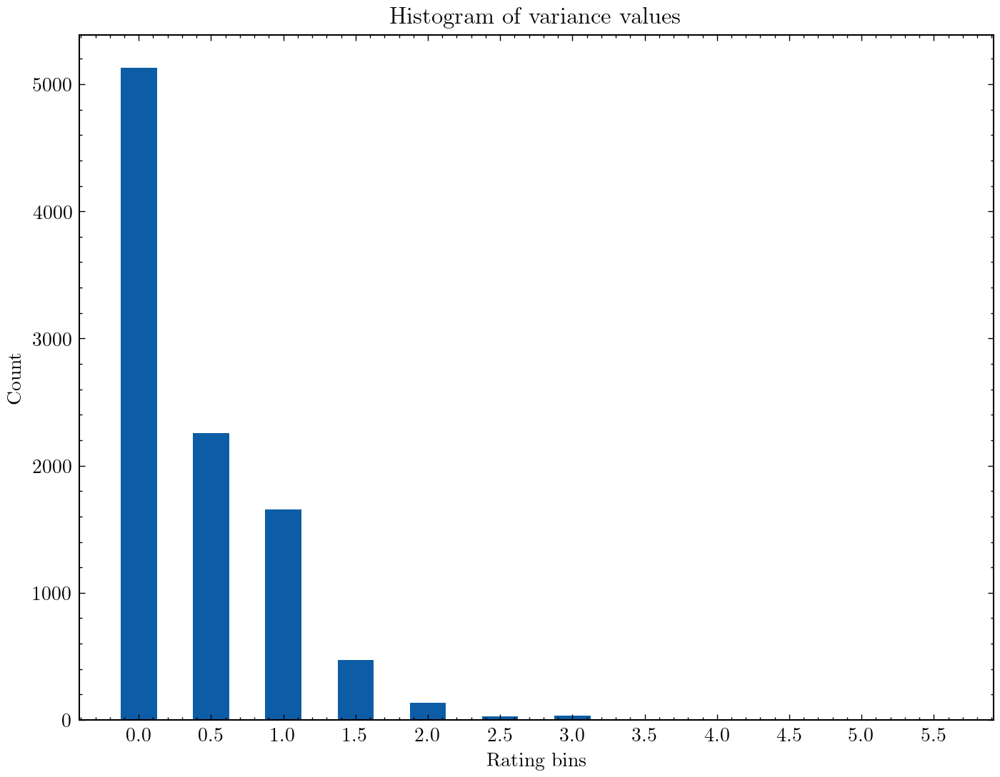

In [ ]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])

variance_bins = list(vals.keys())
variance_counts = list(vals.values())

ax.bar(variance_bins,variance_counts, width=0.25)
ax.set_xticks(variance_bins)

plt.title('Histogram of variance values')
plt.xlabel('Rating bins')
plt.ylabel('Count')

plt.savefig("Q1_6.pdf", dpi=500, bbox_inches='tight')

plt.show()

In [2]:
Rating = pd.read_csv('ratings.csv', sep=',', encoding='latin-1', usecols=['userId', 'movieId', 'rating'])

In [3]:
Rating

,userId,movieId,rating
0,496,112852,3.0
1,391,1947,4.0
2,387,1562,1.5
3,474,2716,4.5
4,483,88125,4.5
...,...,...,...
100831,469,1219,4.0
100832,599,3571,2.0
100833,414,276,3.0
100834,395,168,3.0


In [5]:
numUsers = Rating['userId'].unique().shape
numMovies = Rating['movieId'].unique().shape
print(f'Number of users = {numUsers[0]} | Number of movies = {numMovies[0]}')

Number of users = 610 | Number of movies = 9724


## Questions 4 and 5

In [6]:
dataReader = Reader(line_format ='user item rating', sep=',', rating_scale=(0.5, 5))
completeDataset = Dataset.load_from_df(Rating, dataReader)
overallRMSE = []
overallMAE = []
for value in tqdm(range(2,102,2)):
    kf =  KFold(n_splits=10)
    errors = []
    maes = []
    for train, test in kf.split(completeDataset):
        model = KNNWithMeans(k=value,sim_options={'name':'pearson'},verbose=False).fit(train)
        output = model.test(test)
        errors.append(accuracy.rmse(output,verbose=False))
        maes.append(accuracy.mae(output,verbose=False))
    overallRMSE.append(np.mean(errors))
    overallMAE.append(np.mean(maes))

100%|██████████| 50/50 [05:53<00:00,  7.07s/it]


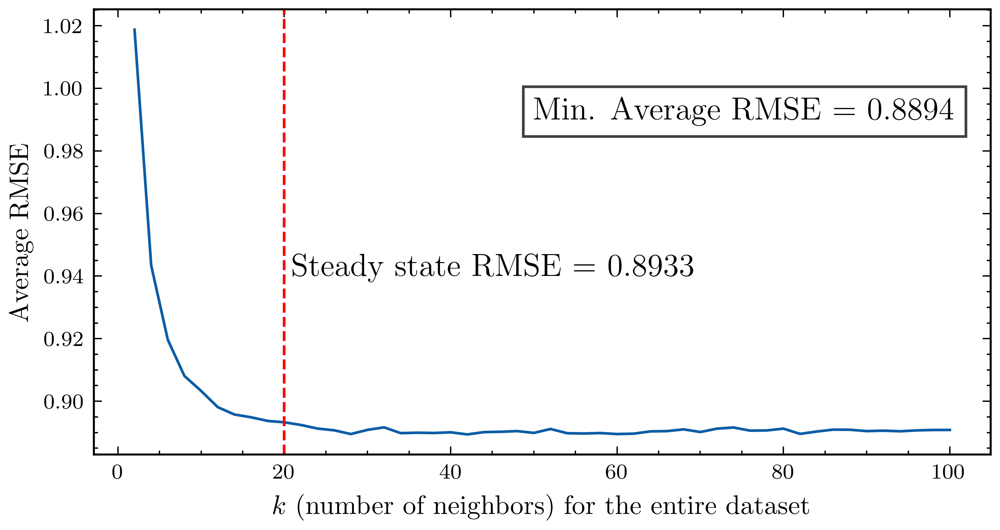

In [7]:
plt.figure(figsize=(6, 3), dpi=300)
plt.plot(range(2,102,2), overallRMSE)
plt.xlabel('$k$ (number of neighbors) for the entire dataset')
plt.ylabel('Average RMSE')
plt.text(x = 50, y = 0.99, s = f'Min. Average RMSE = {min(overallRMSE):.4f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.75))
# add a vertical line at k = 20 and annotate with the RMSE value
plt.axvline(x=20, color='r', linestyle='--')
plt.text(x = 21, y = 0.94, s = f'Steady state RMSE = {overallRMSE[9]:.4f}', fontsize=12)
plt.xticks(size=8)
plt.yticks(size=8)
plt.savefig('Q4_1.pdf', dpi=500, bbox_inches='tight')
plt.show()

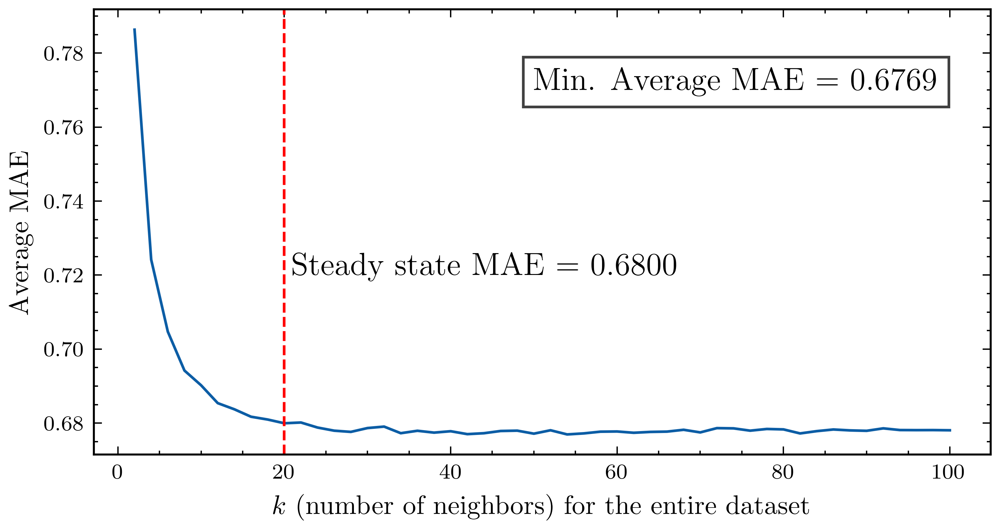

In [8]:
plt.figure(figsize=(6, 3), dpi=300)
plt.plot(range(2,102,2), overallMAE)
plt.xlabel('$k$ (number of neighbors) for the entire dataset')
plt.ylabel('Average MAE')
plt.text(x = 50, y = 0.77, s = f'Min. Average MAE = {min(overallMAE):.4f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.75))
plt.axvline(x=20, color='r', linestyle='--')
plt.text(x = 21, y = 0.72, s = f'Steady state MAE = {overallMAE[9]:.4f}', fontsize=12)
plt.xticks(size=8)
plt.yticks(size=8)
plt.savefig('Q4_2.pdf', dpi=500, bbox_inches='tight')
plt.show()

## Question 6

In [9]:
# Function to create the trimmed dataset
def createTrims(data, trimType='popular'): 
    dataReader = Reader(line_format ='user item rating', sep=',', rating_scale=(0.5, 5))
    # create a counts dictionary for each movie where the key is the movie id and the value is the number of ratings
    counts = data['movieId'].value_counts()
    if trimType == 'popular':
        counts = counts[counts > 2]
        Popular = data[data['movieId'].isin(counts.index)]
        trimmedDataset = Dataset.load_from_df(Popular, dataReader)
    elif trimType == 'unpopular':
        counts = counts[counts <= 2]
        Unpopular = data[data['movieId'].isin(counts.index)]
        trimmedDataset = Dataset.load_from_df(Unpopular, dataReader)
    elif trimType == 'highVar':
        counts = data['movieId'].value_counts()
        counts = counts[counts >= 5]
        variances = data.groupby('movieId')['rating'].var()
        variances = variances[variances >= 2]
        highVar = data[data['movieId'].isin(counts.index) & data['movieId'].isin(variances.index)]
        trimmedDataset = Dataset.load_from_df(highVar, dataReader)
    else:
        print('Invalid trim type')
        return None
    
    return trimmedDataset

dataReader = Reader(line_format ='user item rating', sep=',', rating_scale=(0.5, 5))
completeDataset = Dataset.load_from_df(Rating, dataReader)
popularDataset = createTrims(Rating, trimType='popular')
unpopularDataset = createTrims(Rating, trimType='unpopular')
highVarDataset = createTrims(Rating, trimType='highVar')

In [25]:
overallErrors = []
for value in tqdm(range(2,102,2)):
    kf =  KFold(n_splits=10)
    errors = []
    for train, test in kf.split(popularDataset):
        model = KNNWithMeans(k=value,sim_options={'name':'pearson'},verbose=False).fit(train)
        output = model.test(test)
        errors.append(accuracy.rmse(output,verbose=False))
    overallErrors.append(np.mean(errors))

100%|██████████| 50/50 [05:43<00:00,  6.87s/it]


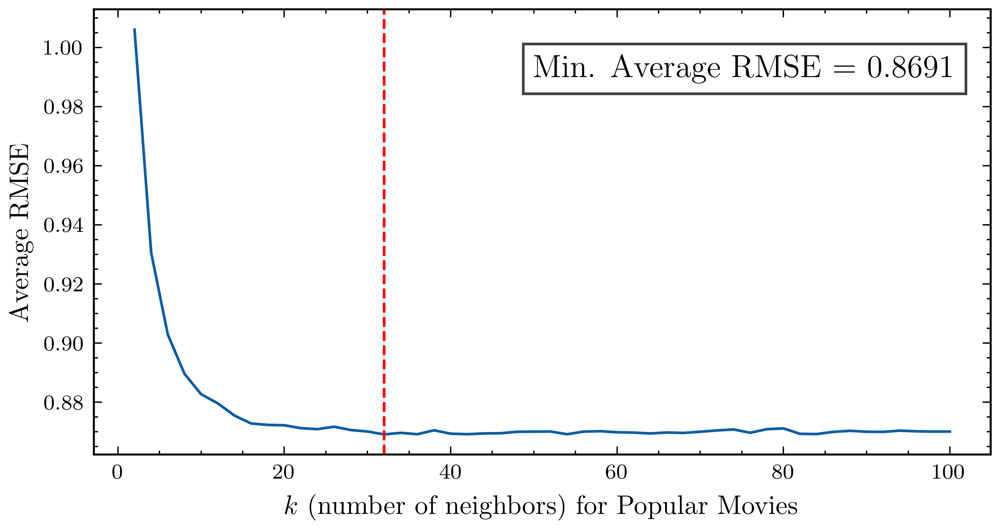

In [26]:
plt.figure(figsize=(6, 3), dpi=300)
plt.plot(range(2,102,2), overallErrors)
plt.xlabel('$k$ (number of neighbors) for Popular Movies')
plt.ylabel('Average RMSE')
plt.text(x = 50, y = 0.99, s = f'Min. Average RMSE = {min(overallErrors):.4f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.75))
plt.axvline(x=overallErrors.index(min(overallErrors))*2+2, color='r', linestyle='--')
plt.xticks(size=8)
plt.yticks(size=8)
plt.savefig('Q6_1.pdf', dpi=500, bbox_inches='tight')
plt.show()
# k = 32

In [27]:
overallErrors.index(min(overallErrors))*2+2

32

In [15]:
overallErrors = []
for value in tqdm(range(2,102,2)):
    kf =  KFold(n_splits=10)
    errors = []
    for train, test in kf.split(unpopularDataset):
        model = KNNWithMeans(k=value,sim_options={'name':'pearson'},verbose=False).fit(train)
        output = model.test(test)
        errors.append(accuracy.rmse(output,verbose=False))
    overallErrors.append(np.mean(errors))

100%|██████████| 50/50 [00:08<00:00,  6.17it/s]


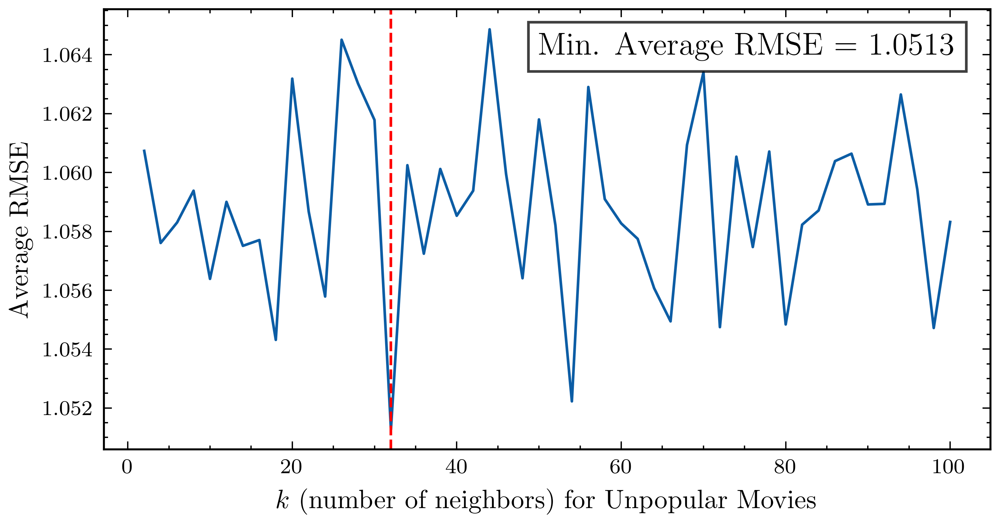

In [20]:
plt.figure(figsize=(6, 3), dpi=300)
plt.plot(range(2,102,2), overallErrors)
plt.xlabel('$k$ (number of neighbors) for Unpopular Movies')
plt.ylabel('Average RMSE')
plt.text(x = 50, y = 1.064, s = f'Min. Average RMSE = {min(overallErrors):.4f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.75))
plt.axvline(x=overallErrors.index(min(overallErrors))*2+2, color='r', linestyle='--')
plt.xticks(size=8)
plt.yticks(size=8)
plt.savefig('Q6_2.pdf', dpi=500, bbox_inches='tight')
plt.show()
# k = 32

In [22]:
overallErrors = []
for value in tqdm(range(2,102,2)):
    kf =  KFold(n_splits=10)
    errors = []
    for train, test in kf.split(highVarDataset):
        model = KNNWithMeans(k=value,sim_options={'name':'pearson'},verbose=False).fit(train)
        output = model.test(test)
        errors.append(accuracy.rmse(output,verbose=False))
    overallErrors.append(np.mean(errors))

100%|██████████| 50/50 [00:01<00:00, 41.63it/s]


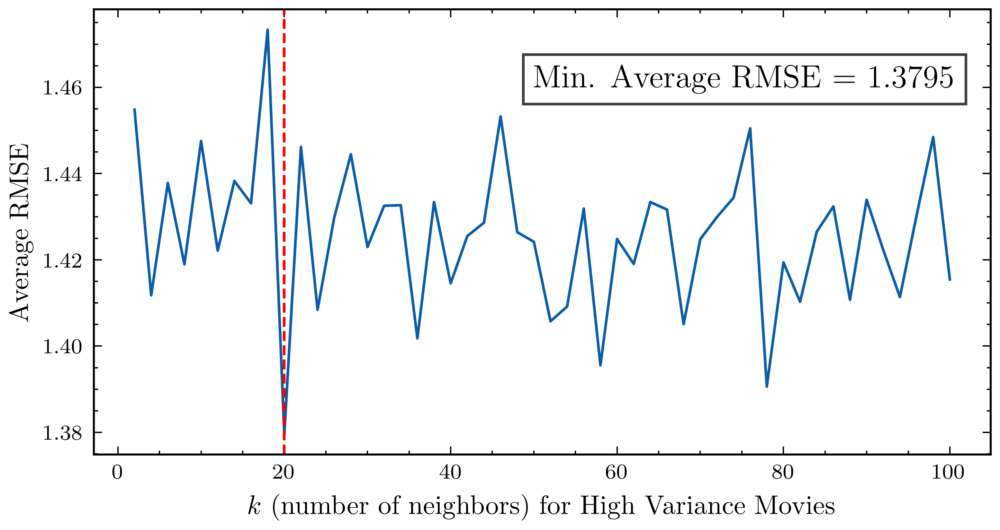

In [24]:
plt.figure(figsize=(6, 3), dpi=300)
plt.plot(range(2,102,2), overallErrors)
plt.xlabel('$k$ (number of neighbors) for High Variance Movies')
plt.ylabel('Average RMSE')
plt.text(x = 50, y = 1.46, s = f'Min. Average RMSE = {min(overallErrors):.4f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.75))
plt.axvline(x=overallErrors.index(min(overallErrors))*2+2, color='r', linestyle='--')
plt.xticks(size=8)
plt.yticks(size=8)
plt.savefig('Q6_3.pdf', dpi=500, bbox_inches='tight')
plt.show()
# k = 20

In [29]:
datasets = {'complete':[completeDataset,20], 'popular':[popularDataset,20], 'unpopular':[unpopularDataset,32], 'highVar':[highVarDataset,20]}
# ROC curves for each dataset across thresholds [2.5, 3, 3.5, 4]
plt.figure(figsize=(8, 7), dpi=500)
for key in datasets:
    train, test = train_test_split(datasets[key][0], test_size=0.1)
    model = KNNWithMeans(k=datasets[key][1],sim_options={'name':'pearson'},verbose=False).fit(train)
    output = model.test(test)
    thresholds = {2.5:[0,0,0], 3:[0,0,0], 3.5:[0,0,0], 4:[0,0,0]}
    plt.subplot(2, 2, list(datasets.keys()).index(key)+1)
    for t in thresholds:
        y_true = [0 if x.r_ui < t else 1 for x in output]
        y_pred = [x.est for x in output]
        thresholds[t][0], thresholds[t][1], th = roc_curve(y_true, y_pred)
        thresholds[t][2] = auc(thresholds[t][0], thresholds[t][1])
        plt.plot(thresholds[t][0], thresholds[t][1], label=f'Thr = {t:.1f}: AUC = {thresholds[t][2]:.4f}')
    plt.plot([0, 1], [0, 1], 'k--')
    # add subplot numbers (a), (b), etc.
    plt.text(0.05, 0.9, f'({chr(97+list(datasets.keys()).index(key))})', transform=plt.gca().transAxes,fontsize=15)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {key} Dataset')
    plt.legend(loc='lower right')
    plt.tight_layout()
plt.savefig('Q6_4.pdf', dpi=500, bbox_inches='tight')
plt.show()

## Question 8

In [32]:
# Use NMF. Similar to question 6.
overallRMSE = []
overallMAE = []
for value in tqdm(range(2,52,2)):
    kf =  KFold(n_splits=10)
    errors = []
    maes = []
    for train, test in kf.split(completeDataset):
        model = NMF(n_factors=value,n_epochs = 50, verbose = False).fit(train)
        output = model.test(test)
        errors.append(accuracy.rmse(output,verbose=False))
        maes.append(accuracy.mae(output,verbose=False))
    overallRMSE.append(np.mean(errors))
    overallMAE.append(np.mean(maes))

100%|██████████| 25/25 [08:30<00:00, 20.43s/it]


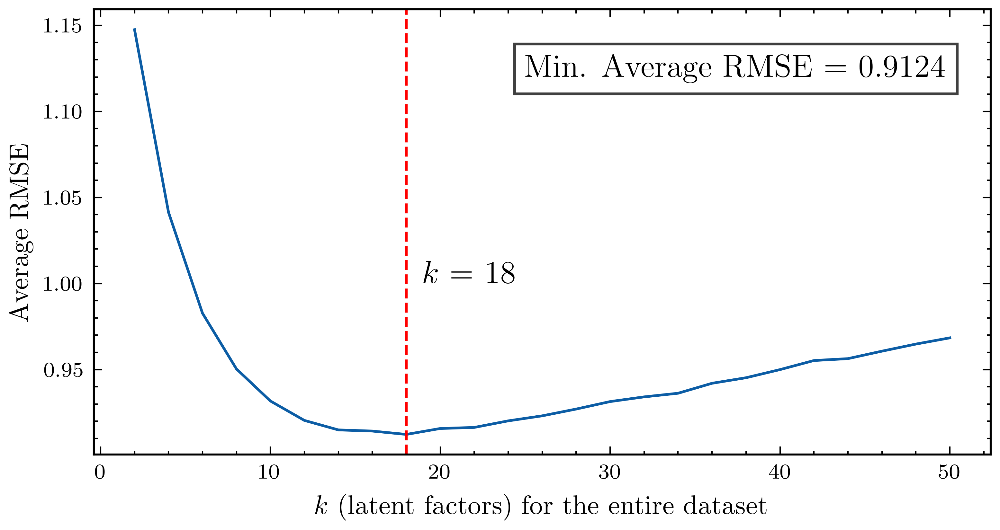

In [34]:
plt.figure(figsize=(6, 3), dpi=300)
plt.plot(range(2,52,2), overallRMSE)
plt.xlabel('$k$ (latent factors) for the entire dataset')
plt.ylabel('Average RMSE')
plt.text(x = 25, y = 1.12, s = f'Min. Average RMSE = {min(overallRMSE):.4f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.75))
# add a vertical line at k = 20 and annotate with the RMSE value
plt.axvline(x=18, color='r', linestyle='--')
plt.text(x = 19, y = 1, s = f'$k$ = {overallRMSE.index(min(overallRMSE))*2+2}', fontsize=12)
plt.xticks(size=8)
plt.yticks(size=8)
plt.savefig('Q8_1.pdf', dpi=500, bbox_inches='tight')
plt.show()

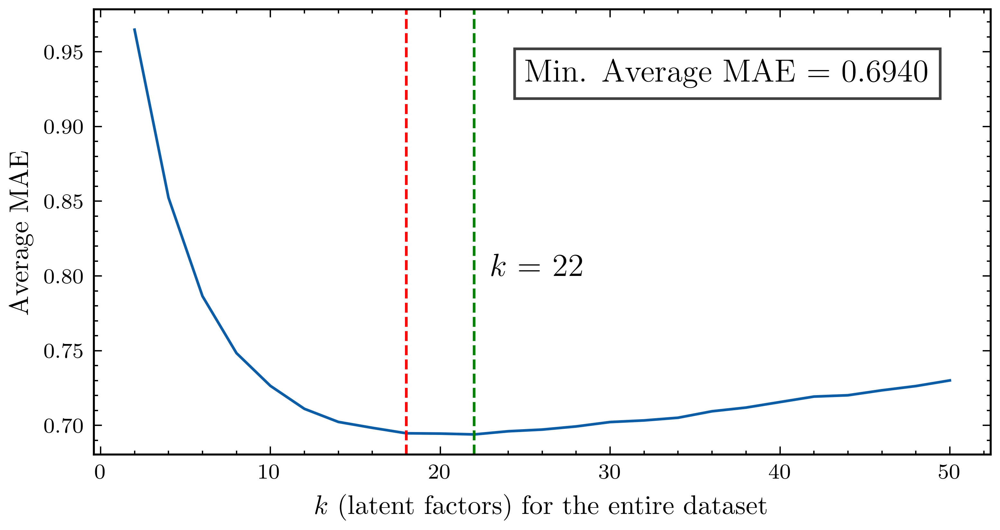

In [36]:
plt.figure(figsize=(6, 3), dpi=300)
plt.plot(range(2,52,2), overallMAE)
plt.xlabel('$k$ (latent factors) for the entire dataset')
plt.ylabel('Average MAE')
plt.text(x = 25, y = 0.93, s = f'Min. Average MAE = {min(overallMAE):.4f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.75))
plt.axvline(x=18, color='r', linestyle='--')
plt.axvline(x=22, color='g', linestyle='--')
plt.text(x = 23, y = 0.8, s = f'$k$ = {overallMAE.index(min(overallMAE))*2+2}', fontsize=12)
plt.xticks(size=8)
plt.yticks(size=8)
plt.savefig('Q8_2.pdf', dpi=500, bbox_inches='tight')
plt.show()

In [37]:
overallErrors = []
for value in tqdm(range(2,52,2)):
    kf =  KFold(n_splits=10)
    errors = []
    for train, test in kf.split(popularDataset):
        model = NMF(n_factors=value,n_epochs = 50, verbose = False).fit(train)
        output = model.test(test)
        errors.append(accuracy.rmse(output,verbose=False))
    overallErrors.append(np.mean(errors))

100%|██████████| 25/25 [06:58<00:00, 16.75s/it]


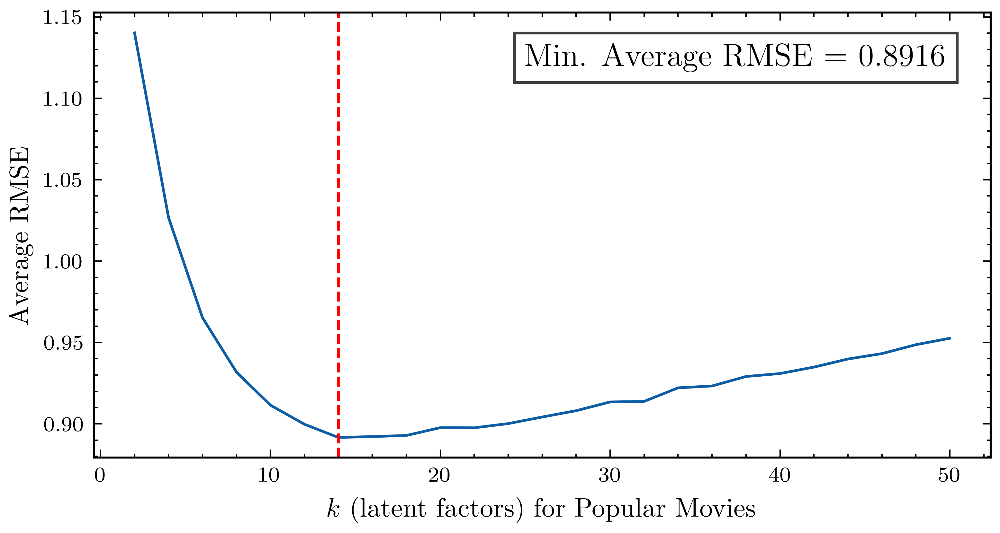

In [38]:
plt.figure(figsize=(6, 3), dpi=300)
plt.plot(range(2,52,2), overallErrors)
plt.xlabel('$k$ (latent factors) for Popular Movies')
plt.ylabel('Average RMSE')
plt.text(x = 25, y = 1.12, s = f'Min. Average RMSE = {min(overallErrors):.4f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.75))
plt.axvline(x=overallErrors.index(min(overallErrors))*2+2, color='r', linestyle='--')
plt.xticks(size=8)
plt.yticks(size=8)
plt.savefig('Q8_3.pdf', dpi=500, bbox_inches='tight')
plt.show()
# k = 14

In [40]:
overallErrors = []
for value in tqdm(range(2,52,2)):
    kf =  KFold(n_splits=10)
    errors = []
    for train, test in kf.split(unpopularDataset):
        model = NMF(n_factors=value, n_epochs = 50, verbose = False).fit(train)
        output = model.test(test)
        errors.append(accuracy.rmse(output,verbose=False))
    overallErrors.append(np.mean(errors))

100%|██████████| 25/25 [01:32<00:00,  3.69s/it]


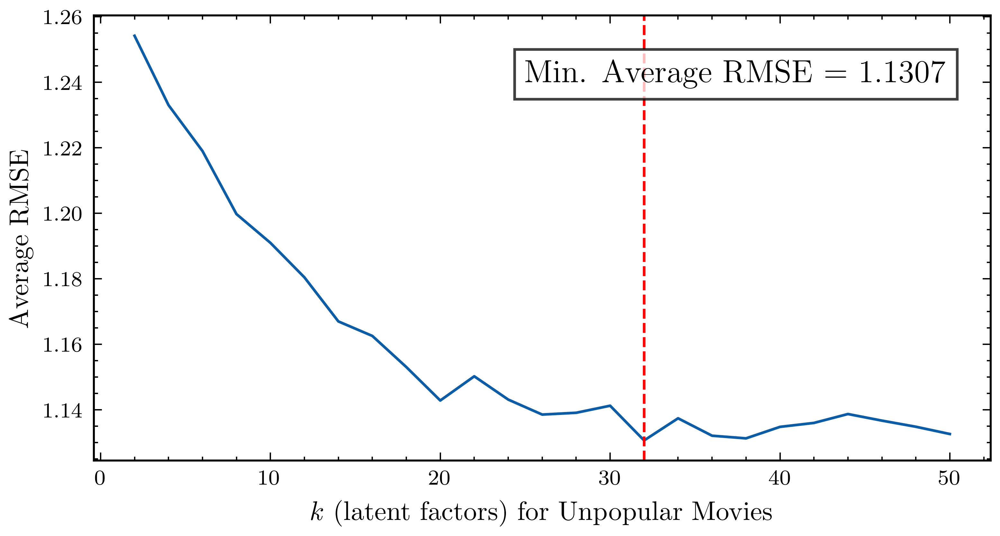

In [41]:
plt.figure(figsize=(6, 3), dpi=300)
plt.plot(range(2,52,2), overallErrors)
plt.xlabel('$k$ (latent factors) for Unpopular Movies')
plt.ylabel('Average RMSE')
plt.text(x = 25, y = 1.24, s = f'Min. Average RMSE = {min(overallErrors):.4f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.75))
plt.axvline(x=overallErrors.index(min(overallErrors))*2+2, color='r', linestyle='--')
plt.xticks(size=8)
plt.yticks(size=8)
plt.savefig('Q8_4.pdf', dpi=500, bbox_inches='tight')
plt.show()
# k = 32

In [46]:
overallErrors = []
for value in tqdm(range(2,52,2)):
    kf =  KFold(n_splits=10)
    errors = []
    for train, test in kf.split(highVarDataset):
        model = NMF(n_factors=value, n_epochs = 50, verbose = False).fit(train)
        output = model.test(test)
        errors.append(accuracy.rmse(output,verbose=False))
    overallErrors.append(np.mean(errors))

100%|██████████| 25/25 [00:05<00:00,  4.33it/s]


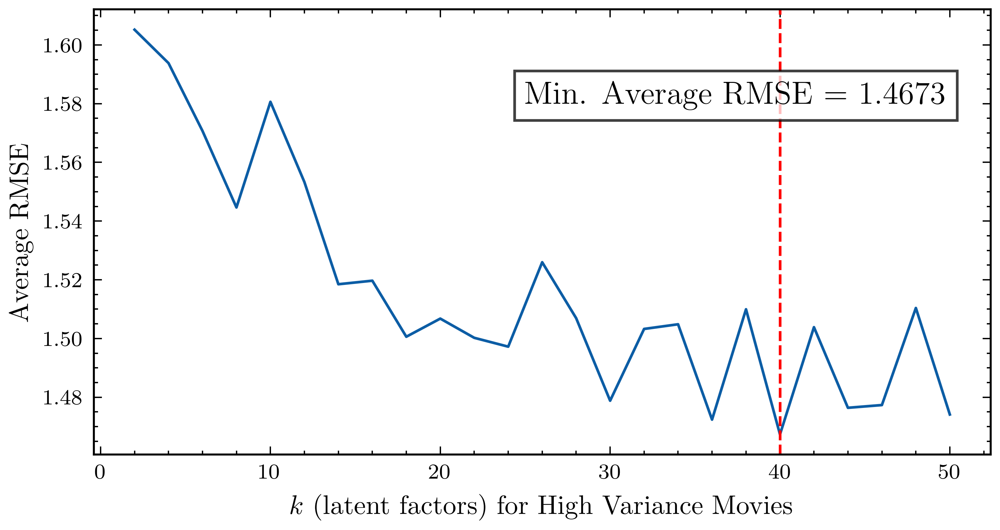

In [50]:
plt.figure(figsize=(6, 3), dpi=300)
plt.plot(range(2,52,2), overallErrors)
plt.xlabel('$k$ (latent factors) for High Variance Movies')
plt.ylabel('Average RMSE')
plt.text(x = 25, y = 1.58, s = f'Min. Average RMSE = {min(overallErrors):.4f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.75))
plt.axvline(x=overallErrors.index(min(overallErrors))*2+2, color='r', linestyle='--')
plt.xticks(size=8)
plt.yticks(size=8)
plt.savefig('Q8_5.pdf', dpi=500, bbox_inches='tight')
plt.show()
# k = 40

In [48]:
datasets = {'complete':[completeDataset,18], 'popular':[popularDataset,14], 'unpopular':[unpopularDataset,32], 'highVar':[highVarDataset,40]}
# ROC curves for each dataset across thresholds [2.5, 3, 3.5, 4]
plt.figure(figsize=(8, 7), dpi=500)
for key in datasets:
    train, test = train_test_split(datasets[key][0], test_size=0.1)
    model = NMF(n_factors=datasets[key][1], n_epochs = 50, verbose = False).fit(train)
    output = model.test(test)
    thresholds = {2.5:[0,0,0], 3:[0,0,0], 3.5:[0,0,0], 4:[0,0,0]}
    plt.subplot(2, 2, list(datasets.keys()).index(key)+1)
    for t in thresholds:
        y_true = [0 if x.r_ui < t else 1 for x in output]
        y_pred = [x.est for x in output]
        thresholds[t][0], thresholds[t][1], th = roc_curve(y_true, y_pred)
        thresholds[t][2] = auc(thresholds[t][0], thresholds[t][1])
        plt.plot(thresholds[t][0], thresholds[t][1], label=f'Thr = {t:.1f}: AUC = {thresholds[t][2]:.4f}')
    plt.plot([0, 1], [0, 1], 'k--')
    # add subplot numbers (a), (b), etc.
    plt.text(0.05, 0.9, f'({chr(97+list(datasets.keys()).index(key))})', transform=plt.gca().transAxes,fontsize=15)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {key} Dataset')
    plt.legend(loc='lower right')
    plt.tight_layout()
plt.savefig('Q8_6.pdf', dpi=500, bbox_inches='tight')
plt.show()

## Question 9

In [75]:
# Interpreting the latent factors
train, test = train_test_split(completeDataset, test_size=0.0001)
model = NMF(n_factors=20, n_epochs = 50, verbose = False).fit(train)
U = model.pu
V = model.qi
movieInfo = pd.read_csv('movies.csv', sep=',', encoding='latin-1', usecols=['movieId', 'title', 'genres'],index_col='movieId')

In [106]:
tables = []
for col in range(V.shape[1]):
    top10 = np.argsort(V[:,col])[-10:][::-1]
    print(f'Latent Factor {col+1}:')
    df = movieInfo.iloc[top10][['genres','title']]
    display(df)
    tables.append(df.style.to_latex())

Latent Factor 1:


,genres,title
movieId,,
5345,Drama,Triumph of the Spirit (1989)
710,Comedy,Celtic Pride (1996)
118572,Comedy|Crime|Drama,The Mule (2014)
51694,Drama|Romance,Starter for 10 (2006)
3425,Drama|Musical,Mo' Better Blues (1990)
58879,Documentary|Musical|IMAX,Shine a Light (2008)
4587,Comedy|Musical|Sci-Fi,Earth Girls Are Easy (1988)
6662,Comedy|Crime,"Pink Panther, The (1963)"
7156,Documentary|War,Fog of War: Eleven Lessons from the Life of Ro...


Latent Factor 2:


,genres,title
movieId,,
5847,Drama,Ragtime (1981)
3701,Crime|Drama|Sci-Fi|Thriller,Alien Nation (1988)
4064,Action|Crime|Thriller,Coffy (1973)
9005,Drama|Mystery|Sci-Fi,Fire in the Sky (1993)
41997,Action|Crime|Drama|Thriller,Munich (2005)
55765,Crime|Drama|Thriller,American Gangster (2007)
59118,Comedy|Drama,Happy-Go-Lucky (2008)
92954,Drama,Prayers for Bobby (2009)
2300,Comedy,"Producers, The (1968)"


Latent Factor 3:


,genres,title
movieId,,
5416,Comedy|Drama|Thriller,Cherish (2002)
5922,Action,Attila (Attila Flagello di Dio) (1982)
3986,Action|Sci-Fi|Thriller,"6th Day, The (2000)"
96829,Drama,"Hunt, The (Jagten) (2012)"
7303,Drama|War,The Diary of Anne Frank (1959)
535,Drama,Short Cuts (1993)
2939,Drama|Thriller,Niagara (1953)
2089,Adventure|Animation|Children,"Rescuers Down Under, The (1990)"
32022,Documentary|War,Gunner Palace (2004)


Latent Factor 4:


,genres,title
movieId,,
5416,Comedy|Drama|Thriller,Cherish (2002)
98503,Action|Comedy,Half a Loaf of Kung Fu (Dian zhi gong fu gan c...
2290,Comedy|Drama,Stardust Memories (1980)
3287,Animation|Children,"Tigger Movie, The (2000)"
2521,Action|Drama|Thriller,Airport 1975 (1974)
1526,Comedy,Fathers' Day (1997)
7364,Comedy|Crime|Drama,Intermission (2003)
44195,Comedy|Drama,Thank You for Smoking (2006)
3795,Drama,"Five Senses, The (1999)"


Latent Factor 5:


,genres,title
movieId,,
5507,Action|Crime|Thriller,xXx (2002)
906,Drama|Thriller,Gaslight (1944)
4980,Adventure|Comedy|Fantasy|Sci-Fi,Bill & Ted's Bogus Journey (1991)
6662,Comedy|Crime,"Pink Panther, The (1963)"
91981,Drama,Sacrifice (Zhao shi gu er) (2010)
4587,Comedy|Musical|Sci-Fi,Earth Girls Are Easy (1988)
4769,Documentary,Into the Arms of Strangers: Stories of the Kin...
2618,Comedy,"Castle, The (1997)"
33815,Comedy|Drama|Romance,"Perfect Man, The (2005)"


Latent Factor 6:


,genres,title
movieId,,
93114,Comedy|Drama,Ro.Go.Pa.G. (1963)
34450,Action|Comedy|Crime|Drama,Miracles - Mr. Canton and Lady Rose (1989)
619,Comedy,Ed (1996)
5663,Horror,Below (2002)
71379,Horror|Thriller,Paranormal Activity (2009)
8024,Comedy|Drama|Romance,"Thing Called Love, The (1993)"
3243,Comedy,Encino Man (1992)
5313,Action|Adventure|Fantasy|Thriller,The Scorpion King (2002)
3104,Action|Comedy|Crime|Thriller,Midnight Run (1988)


Latent Factor 7:


,genres,title
movieId,,
5663,Horror,Below (2002)
468,Comedy|Romance,Englishman Who Went Up a Hill But Came Down a ...
6951,Children|Comedy,"Cat in the Hat, The (2003)"
722,Documentary,"Haunted World of Edward D. Wood Jr., The (1996)"
7017,Action|Thriller,Passenger 57 (1992)
65740,Comedy|Romance,Revenge of the Nerds IV: Nerds in Love (1994)
4355,Action|Drama,Youngblood (1986)
6551,Comedy|Romance,"Anarchist Cookbook, The (2002)"
46578,Adventure|Comedy|Drama,Little Miss Sunshine (2006)


Latent Factor 8:


,genres,title
movieId,,
6790,Drama|Fantasy|Sci-Fi,Avalon (2001)
2937,Comedy,"Palm Beach Story, The (1942)"
6030,Comedy|Musical,Girls! Girls! Girls! (1962)
52042,Drama|Thriller|War,Black Book (Zwartboek) (2006)
210,Western,Wild Bill (1995)
2765,Comedy|Drama,"Acid House, The (1998)"
388,Drama,Boys Life (1995)
2544,Drama|Romance,"School of Flesh, The (Ãcole de la chair, L') ..."
1526,Comedy,Fathers' Day (1997)


Latent Factor 9:


,genres,title
movieId,,
3362,Crime|Drama,Dog Day Afternoon (1975)
90746,Action|Animation|Mystery|IMAX,"Adventures of Tintin, The (2011)"
118894,Animation|Children|Mystery,Scooby-Doo! Abracadabra-Doo (2010)
2948,Action|Adventure|Thriller,From Russia with Love (1963)
27788,Drama|Mystery|Sci-Fi|Thriller,"Jacket, The (2005)"
6970,Comedy|Romance,Desk Set (1957)
3308,Comedy|Drama,"Flamingo Kid, The (1984)"
74452,Horror|Thriller,"Wolfman, The (2010)"
1729,Crime|Drama|Thriller,Jackie Brown (1997)


Latent Factor 10:


,genres,title
movieId,,
1081,Comedy|Musical|Romance,Victor/Victoria (1982)
5278,Comedy|Romance,Fraternity Vacation (1985)
26308,Drama|Romance,Turkish Delight (Turks fruit) (1973)
2971,Drama|Fantasy|Musical,All That Jazz (1979)
26453,Drama|Mystery,Smiley's People (1982)
3011,Drama,"They Shoot Horses, Don't They? (1969)"
1297,Comedy,Real Genius (1985)
5279,Comedy|Romance,Impromptu (1991)
44929,Drama|Romance,Candy (2006)


Latent Factor 11:


,genres,title
movieId,,
87222,Action|Adventure|Animation|Children|Comedy|IMAX,Kung Fu Panda 2 (2011)
8620,Comedy|Drama|Fantasy|Mystery,"Exterminating Angel, The (Ãngel exterminador,..."
38388,Drama,Goal! The Dream Begins (Goal!) (2005)
3843,Horror,Sleepaway Camp (1983)
8197,Drama|Romance|War,Hiroshima Mon Amour (1959)
51545,Action|Comedy|Drama|Horror|Thriller,Pusher III: I'm the Angel of Death (2005)
1858,Action|Comedy,Mr. Nice Guy (Yat goh ho yan) (1997)
1046,Drama|Romance,Beautiful Thing (1996)
4226,Mystery|Thriller,Memento (2000)


Latent Factor 12:


,genres,title
movieId,,
2555,Comedy,Baby Geniuses (1999)
1526,Comedy,Fathers' Day (1997)
27416,Comedy|Drama|Romance,Jalla! Jalla! (2000)
4477,Adventure|Children|Comedy,Big Top Pee-Wee (1988)
3701,Crime|Drama|Sci-Fi|Thriller,Alien Nation (1988)
7920,Comedy|Crime,Desperate Living (1977)
1178,Drama|War,Paths of Glory (1957)
5348,Comedy|Drama,Hollywood Ending (2002)
5929,Comedy|Romance,"Party 2, The (Boum 2, La) (1982)"


Latent Factor 13:


,genres,title
movieId,,
6055,Drama,Sugar Hill (1994)
56915,Adventure|Children|Fantasy,"Water Horse: Legend of the Deep, The (2007)"
2739,Drama,"Color Purple, The (1985)"
3327,Documentary,Beyond the Mat (1999)
40697,Sci-Fi,Babylon 5
33815,Comedy|Drama|Romance,"Perfect Man, The (2005)"
6863,Comedy|Musical,School of Rock (2003)
82242,Action|Comedy,Rare Exports: A Christmas Tale (Rare Exports) ...
47465,Drama|Fantasy|Thriller,Tideland (2005)


Latent Factor 14:


,genres,title
movieId,,
135518,Action|Mystery|Sci-Fi|Thriller,Self/less (2015)
7037,Comedy|Drama,High Heels (Tacones lejanos) (1991)
2500,Comedy,Jawbreaker (1999)
1844,Drama|Romance,Live Flesh (Carne trÃ©mula) (1997)
8677,Action|Sci-Fi,Flash Gordon Conquers the Universe (1940)
82242,Action|Comedy,Rare Exports: A Christmas Tale (Rare Exports) ...
6582,Action|Comedy|Crime|Thriller,Remo Williams: The Adventure Begins (1985)
7299,Drama,Monsieur Ibrahim (Monsieur Ibrahim et les fleu...
7258,Comedy|Crime,"Perfect Score, The (2004)"


Latent Factor 15:


,genres,title
movieId,,
5071,Drama|Romance,MaelstrÃ¶m (2000)
79897,Comedy|Drama|Mystery,Get Low (2009)
2114,Drama,"Outsiders, The (1983)"
53578,Comedy,"Valet, The (La doublure) (2006)"
722,Documentary,"Haunted World of Edward D. Wood Jr., The (1996)"
7294,Comedy,Welcome to Mooseport (2004)
44397,Drama|Horror|Thriller,"Hills Have Eyes, The (2006)"
6616,Action|Comedy,Grind (2003)
1696,Drama|War,Bent (1997)


Latent Factor 16:


,genres,title
movieId,,
3584,Action|Drama|Romance|Thriller,Breathless (1983)
26510,Adventure|Children|Fantasy|Sci-Fi,"Ewok Adventure, The (a.k.a. Caravan of Courage..."
3771,Action|Adventure|Fantasy,The Golden Voyage of Sinbad (1973)
4012,Comedy|Drama,Punchline (1988)
67295,Action|Animation|Children|Comedy,Kung Fu Panda: Secrets of the Furious Five (2008)
8614,Comedy|Romance,Overboard (1987)
6345,Comedy|Drama|Musical,"Chorus Line, A (1985)"
3990,Animation|Children|Comedy,Rugrats in Paris: The Movie (2000)
1783,Crime|Drama|Mystery|Romance|Thriller,Palmetto (1998)


Latent Factor 17:


,genres,title
movieId,,
3574,Horror|Sci-Fi,Carnosaur 3: Primal Species (1996)
5984,Drama|Romance,"Story of O, The (Histoire d'O) (1975)"
6687,Comedy|Romance,My Boss's Daughter (2003)
7090,Action|Adventure|Drama,Hero (Ying xiong) (2002)
3858,Comedy,Cecil B. DeMented (2000)
6539,Action|Adventure|Comedy|Fantasy,Pirates of the Caribbean: The Curse of the Bla...
1244,Comedy|Drama|Romance,Manhattan (1979)
3504,Comedy|Drama,Network (1976)
163386,Animation,Winnie the Pooh and the Day of Concern (1972)


Latent Factor 18:


,genres,title
movieId,,
5573,Comedy|Crime,Stealing Harvard (2002)
61167,Drama|Mystery,Henry Poole is Here (2008)
2391,Crime|Drama|Thriller,"Simple Plan, A (1998)"
72692,Animation|Comedy|Fantasy,Mickey's Once Upon a Christmas (1999)
3550,Horror,The Hunger (1983)
5064,Action|Adventure|Drama|Thriller,The Count of Monte Cristo (2002)
4217,Documentary,4 Little Girls (1997)
5099,Children|Drama,Heidi (1937)
8620,Comedy|Drama|Fantasy|Mystery,"Exterminating Angel, The (Ãngel exterminador,..."


Latent Factor 19:


,genres,title
movieId,,
6987,Crime|Fantasy|Horror,"Cabinet of Dr. Caligari, The (Cabinet des Dr. ..."
40819,Drama|Musical|Romance,Walk the Line (2005)
3733,Drama,"Paper Chase, The (1973)"
51545,Action|Comedy|Drama|Horror|Thriller,Pusher III: I'm the Angel of Death (2005)
786,Action|Drama|Thriller,Eraser (1996)
52328,Adventure|Drama|Sci-Fi|Thriller,Sunshine (2007)
3089,Drama,Bicycle Thieves (a.k.a. The Bicycle Thief) (a....
8782,Action|Adventure|Fantasy|Sci-Fi,Thunderbirds (2004)
5974,Adventure|Fantasy,"Thief of Bagdad, The (1940)"


Latent Factor 20:


,genres,title
movieId,,
32058,Drama,Class Action (1991)
4623,Comedy,Major League (1989)
4403,Horror,"Fall of the House of Usher, The (House of Ushe..."
58301,Drama|Thriller,Funny Games U.S. (2007)
2662,Action|Drama|Sci-Fi,"War of the Worlds, The (1953)"
2116,Adventure|Animation|Children|Fantasy,"Lord of the Rings, The (1978)"
163386,Animation,Winnie the Pooh and the Day of Concern (1972)
71379,Horror|Thriller,Paranormal Activity (2009)
27788,Drama|Mystery|Sci-Fi|Thriller,"Jacket, The (2005)"


In [78]:
U.shape

(610, 20)

## Question 10

In [54]:
# Use SVD. Similar to question 6.
overallRMSE = []
overallMAE = []
for value in tqdm(range(2,52,2)):
    kf =  KFold(n_splits=10)
    errors = []
    maes = []
    for train, test in kf.split(completeDataset):
        model = SVD(n_factors = value, n_epochs = 20, verbose = False).fit(train)
        output = model.test(test)
        errors.append(accuracy.rmse(output,verbose=False))
        maes.append(accuracy.mae(output,verbose=False))
    overallRMSE.append(np.mean(errors))
    overallMAE.append(np.mean(maes))

100%|██████████| 25/25 [02:19<00:00,  5.56s/it]


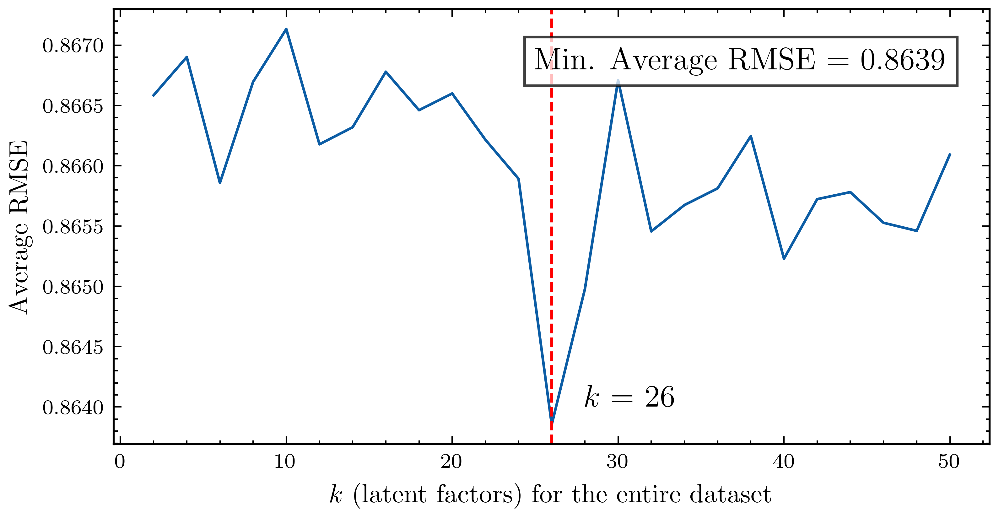

In [60]:
plt.figure(figsize=(6, 3), dpi=300)
plt.plot(range(2,52,2), overallRMSE)
plt.xlabel('$k$ (latent factors) for the entire dataset')
plt.ylabel('Average RMSE')
plt.text(x = 25, y = 0.8668, s = f'Min. Average RMSE = {min(overallRMSE):.4f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.75))
# add a vertical line at k = 20 and annotate with the RMSE value
plt.axvline(x=26, color='r', linestyle='--')
plt.text(x = 28, y = 0.8640, s = f'$k$ = {overallRMSE.index(min(overallRMSE))*2+2}', fontsize=12)
plt.xticks(size=8)
plt.yticks(size=8)
plt.savefig('Q10_1.pdf', dpi=500, bbox_inches='tight')
plt.show()

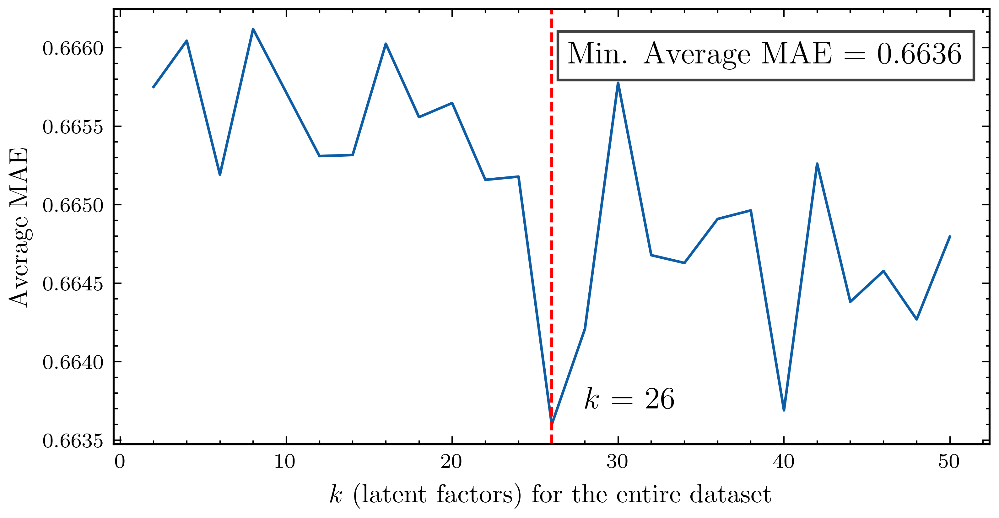

In [64]:
plt.figure(figsize=(6, 3), dpi=300)
plt.plot(range(2,52,2), overallMAE)
plt.xlabel('$k$ (latent factors) for the entire dataset')
plt.ylabel('Average MAE')
plt.text(x = 27, y = 0.6659, s = f'Min. Average MAE = {min(overallMAE):.4f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.75))
plt.axvline(x=26, color='r', linestyle='--')
plt.text(x = 28, y = 0.6637, s = f'$k$ = {overallMAE.index(min(overallMAE))*2+2}', fontsize=12)
plt.xticks(size=8)
plt.yticks(size=8)
plt.savefig('Q10_2.pdf', dpi=500, bbox_inches='tight')
plt.show()

In [114]:
overallErrors = []
for value in tqdm(range(2,52,2)):
    kf =  KFold(n_splits=10)
    errors = []
    for train, test in kf.split(popularDataset):
        model = SVD(n_factors = value, n_epochs = 20, verbose = False).fit(train)
        output = model.test(test)
        errors.append(accuracy.rmse(output,verbose=False))
    overallErrors.append(np.mean(errors))

100%|██████████| 25/25 [02:11<00:00,  5.25s/it]


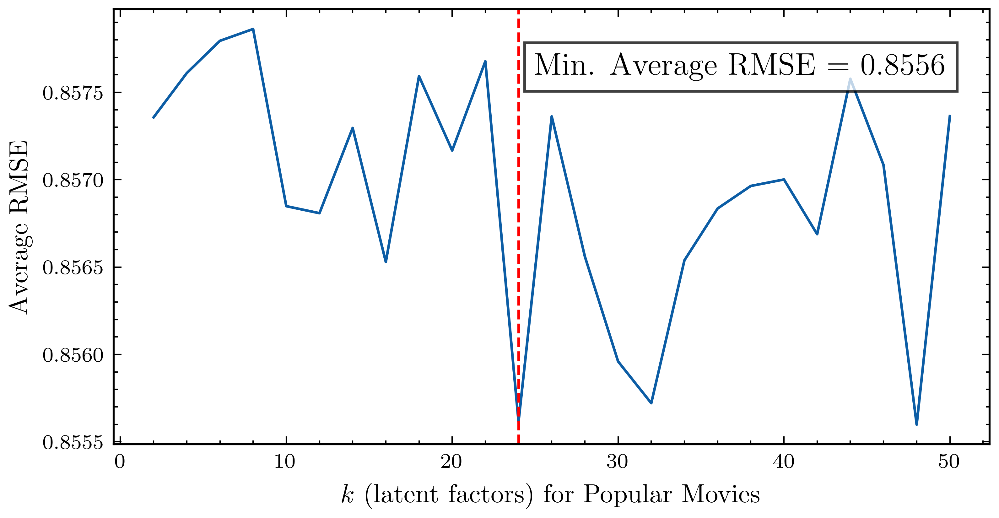

In [117]:
plt.figure(figsize=(6, 3), dpi=300)
plt.plot(range(2,52,2), overallErrors)
plt.xlabel('$k$ (latent factors) for Popular Movies')
plt.ylabel('Average RMSE')
plt.text(x = 25, y = 0.8576, s = f'Min. Average RMSE = {min(overallErrors):.4f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.75))
plt.axvline(x=overallErrors.index(min(overallErrors))*2+2, color='r', linestyle='--')
plt.xticks(size=8)
plt.yticks(size=8)
plt.savefig('Q10_3.pdf', dpi=500, bbox_inches='tight')
plt.show()
# k = 24

In [118]:
overallErrors = []
for value in tqdm(range(2,52,2)):
    kf =  KFold(n_splits=10)
    errors = []
    for train, test in kf.split(unpopularDataset):
        model = SVD(n_factors = value, n_epochs = 20, verbose = False).fit(train)
        output = model.test(test)
        errors.append(accuracy.rmse(output,verbose=False))
    overallErrors.append(np.mean(errors))

100%|██████████| 25/25 [00:07<00:00,  3.43it/s]


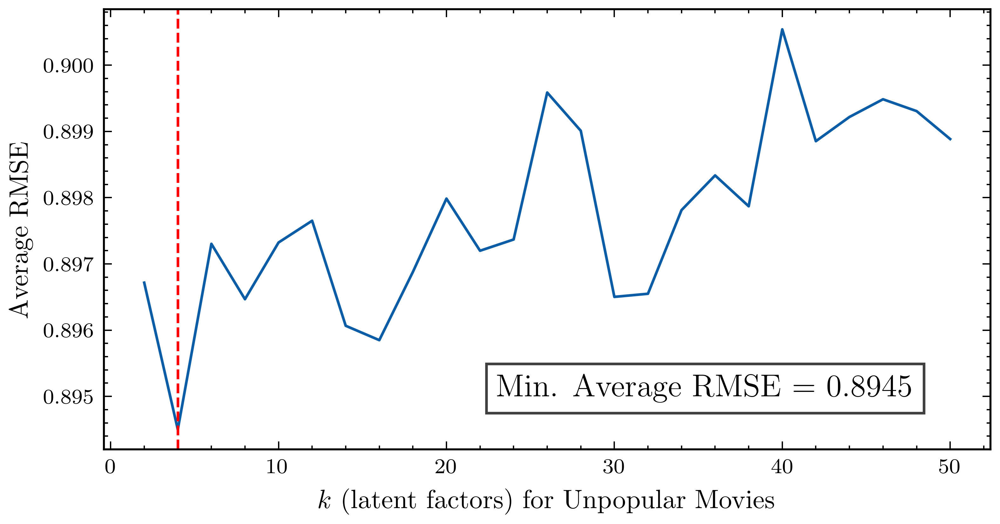

In [122]:
plt.figure(figsize=(6, 3), dpi=300)
plt.plot(range(2,52,2), overallErrors)
plt.xlabel('$k$ (latent factors) for Unpopular Movies')
plt.ylabel('Average RMSE')
plt.text(x = 23, y = 0.895, s = f'Min. Average RMSE = {min(overallErrors):.4f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.75))
plt.axvline(x=overallErrors.index(min(overallErrors))*2+2, color='r', linestyle='--')
plt.xticks(size=8)
plt.yticks(size=8)
plt.savefig('Q10_4.pdf', dpi=500, bbox_inches='tight')
plt.show()
# k = 4

In [123]:
overallErrors = []
for value in tqdm(range(2,52,2)):
    kf =  KFold(n_splits=10)
    errors = []
    for train, test in kf.split(highVarDataset):
        model = SVD(n_factors = value, n_epochs = 20, verbose = False).fit(train)
        output = model.test(test)
        errors.append(accuracy.rmse(output,verbose=False))
    overallErrors.append(np.mean(errors))

100%|██████████| 25/25 [00:00<00:00, 44.65it/s]


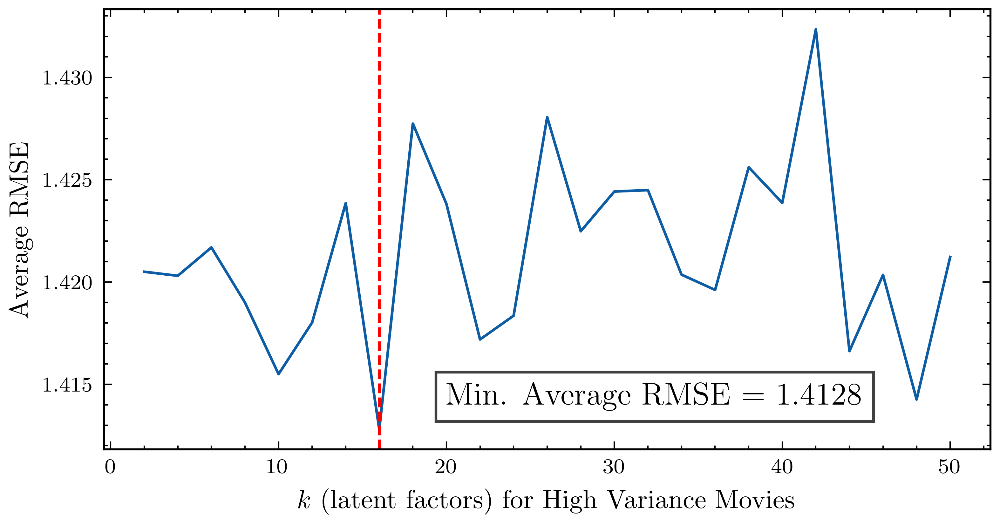

In [127]:
plt.figure(figsize=(6, 3), dpi=300)
plt.plot(range(2,52,2), overallErrors)
plt.xlabel('$k$ (latent factors) for High Variance Movies')
plt.ylabel('Average RMSE')
plt.text(x = 20, y = 1.414, s = f'Min. Average RMSE = {min(overallErrors):.4f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.75))
plt.axvline(x=overallErrors.index(min(overallErrors))*2+2, color='r', linestyle='--')
plt.xticks(size=8)
plt.yticks(size=8)
plt.savefig('Q10_5.pdf', dpi=500, bbox_inches='tight')
plt.show()
# k = 16

In [128]:
datasets = {'complete':[completeDataset,26], 'popular':[popularDataset,24], 'unpopular':[unpopularDataset,4], 'highVar':[highVarDataset,16]}
# ROC curves for each dataset across thresholds [2.5, 3, 3.5, 4]
plt.figure(figsize=(8, 7), dpi=500)
for key in datasets:
    train, test = train_test_split(datasets[key][0], test_size=0.1)
    model = SVD(n_factors = datasets[key][1], n_epochs = 20, verbose = False).fit(train)
    output = model.test(test)
    thresholds = {2.5:[0,0,0], 3:[0,0,0], 3.5:[0,0,0], 4:[0,0,0]}
    plt.subplot(2, 2, list(datasets.keys()).index(key)+1)
    for t in thresholds:
        y_true = [0 if x.r_ui < t else 1 for x in output]
        y_pred = [x.est for x in output]
        thresholds[t][0], thresholds[t][1], th = roc_curve(y_true, y_pred)
        thresholds[t][2] = auc(thresholds[t][0], thresholds[t][1])
        plt.plot(thresholds[t][0], thresholds[t][1], label=f'Thr = {t:.1f}: AUC = {thresholds[t][2]:.4f}')
    plt.plot([0, 1], [0, 1], 'k--')
    # add subplot numbers (a), (b), etc.
    plt.text(0.05, 0.9, f'({chr(97+list(datasets.keys()).index(key))})', transform=plt.gca().transAxes,fontsize=15)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {key} Dataset')
    plt.legend(loc='lower right')
    plt.tight_layout()
plt.savefig('Q10_6.pdf', dpi=500, bbox_inches='tight')
plt.show()

## Question 11

In [140]:
# 1. Train/test on the complete dataset and print RMSE (10-fold CV)  
# 2. Train/test on the popular, unpopular and highVar datasets and print RMSE (10-fold CV)
meanRating = Rating.groupby('userId')['rating'].mean()
kf =  KFold(n_splits=10)
errors = []
for train, test in kf.split(completeDataset):
    errors.append(mean_squared_error([x[2] for x in test],[meanRating[x[0]] for x in test], squared=False))
print(f'RMSE for Complete dataset: {np.mean(errors):.4f}')
errors = []
for train, test in kf.split(popularDataset):
    errors.append(mean_squared_error([x[2] for x in test],[meanRating[x[0]] for x in test], squared=False))
print(f'RMSE for Popular dataset: {np.mean(errors):.4f}')
errors = []
for train, test in kf.split(unpopularDataset):
    errors.append(mean_squared_error([x[2] for x in test],[meanRating[x[0]] for x in test], squared=False))
print(f'RMSE for Unpopular dataset: {np.mean(errors):.4f}')
errors = []
for train, test in kf.split(highVarDataset):
    errors.append(mean_squared_error([x[2] for x in test],[meanRating[x[0]] for x in test], squared=False))
print(f'RMSE for High Variance dataset: {np.mean(errors):.4f}')

RMSE for Complete dataset: 0.9347
RMSE for Popular dataset: 0.9323
RMSE for Unpopular dataset: 0.9709
RMSE for High Variance dataset: 1.3763


## Question 12

In [150]:
datasets = {'complete':[completeDataset,20,18,26], 'popular':[popularDataset,20,14,24], 'unpopular':[unpopularDataset,32,32,4], 'highVar':[highVarDataset,20,40,16]}
plt.figure(figsize=(8, 7), dpi=500)
for key in datasets:
    train, test = train_test_split(datasets[key][0], test_size=0.1)
    outputs = dict.fromkeys(['kNN','NMF','SVD'])
    model1 = KNNWithMeans(k=datasets[key][1],sim_options={'name':'pearson'},verbose=False).fit(train)
    outputs['kNN'] = model1.test(test)
    model2 = NMF(n_factors = datasets[key][2], n_epochs = 50, verbose = False).fit(train)
    outputs['NMF'] = model2.test(test)
    model3 = SVD(n_factors = datasets[key][3], n_epochs = 20, verbose = False).fit(train)
    outputs['SVD'] = model3.test(test)
    plt.subplot(2, 2, list(datasets.keys()).index(key)+1)
    for output in outputs:
        y_true = [0 if x.r_ui < 3 else 1 for x in outputs[output]]
        y_pred = [x.est for x in outputs[output]]
        fpr, tpr, th = roc_curve(y_true, y_pred)
        aucVal = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'Model: {output:4}: AUC = {aucVal:.4f}')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.text(0.05, 0.9, f'({chr(97+list(datasets.keys()).index(key))})', transform=plt.gca().transAxes,fontsize=15)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {key.capitalize()} Dataset')
    plt.legend(loc='lower right')
    plt.tight_layout()
plt.savefig('Q12.pdf', dpi=500, bbox_inches='tight')
plt.show()

## Question 14

In [182]:
# First architecture : kNN
knnPrecision = []
knnRecall = []
for t in tqdm(np.arange(1,26)):
    kf = KFold(n_splits=10)
    meanPrecision = []
    meanRecall = []
    for train, test in kf.split(completeDataset):
        G = {} # dictionary with key = user and value = list of movies rated by the user
        allRatings = {}
        for element in test:
            allRatings[element[0]] = allRatings.get(element[0],0) + 1
            if element[2] >= 3:
                if element[0] in G:
                    G[element[0]].append(element[1])
                else:
                    G[element[0]] = [element[1]]
        allRatings = {k: v for k, v in allRatings.items() if v >= t}
        G = {k: v for k, v in G.items() if k in allRatings}

        model = KNNWithMeans(k=20, sim_options={'name':'pearson'}, verbose=False).fit(train)
        output = model.test(test)
        foldPrecision = []
        foldRecall = []
        for user in G:
            preds = [(output[i][1], output[i][2]) for i in range(len(output)) if output[i][0] == user]
            preds.sort(key=lambda x: x[1], reverse=True)
            preds = [p[0] for p in preds[:t]]
            intersection = set(G[user]).intersection(set(preds))
            userPrecision = len(intersection)/len(preds)*1.0
            userRecall = len(intersection)/len(G[user])*1.0
            foldPrecision.append(userPrecision)
            foldRecall.append(userRecall)
        meanPrecision.append(np.mean(foldPrecision))
        meanRecall.append(np.mean(foldRecall))
    knnPrecision.append(np.mean(meanPrecision))
    knnRecall.append(np.mean(meanRecall))

100%|██████████| 25/25 [03:26<00:00,  8.27s/it]


In [201]:
plt.figure(figsize=(15, 4), dpi=500)
plt.subplot(1,3,1)
plt.plot(np.arange(1,26), knnPrecision, label='Precision')
plt.xlabel('Number of Recommendations (t)')
plt.ylabel('Average Precision')
plt.xticks(size=6)
plt.yticks(size=6)
plt.title('Precision for kNN model')

plt.subplot(1,3,2)
plt.plot(np.arange(1,26), knnRecall, label='Recall')
plt.xlabel('Number of Recommendations (t)')
plt.ylabel('Average Recall')
plt.xticks(size=6)
plt.yticks(size=6)
plt.title('Recall for kNN model')

plt.subplot(1,3,3)
plt.plot(knnRecall, knnPrecision, label='Precision-Recall Curve')
plt.xlabel('Average Recall')
plt.ylabel('Average Precision')
plt.xticks(size=6)
plt.yticks(size=6)
plt.title('Precision-Recall curve for kNN model')
plt.tight_layout()
plt.savefig('Q14_1.pdf', dpi=500, bbox_inches='tight')
plt.show()

In [189]:
# Second architecture : NMF
NMFPrecision = []
NMFRecall = []
for t in tqdm(np.arange(1,26)):
    kf = KFold(n_splits=10)
    meanPrecision = []
    meanRecall = []
    for train, test in kf.split(completeDataset):
        G = {} # dictionary with key = user and value = list of movies rated by the user
        allRatings = {}
        for element in test:
            allRatings[element[0]] = allRatings.get(element[0],0) + 1
            if element[2] >= 3:
                if element[0] in G:
                    G[element[0]].append(element[1])
                else:
                    G[element[0]] = [element[1]]
        allRatings = {k: v for k, v in allRatings.items() if v >= t}
        G = {k: v for k, v in G.items() if k in allRatings}

        model = NMF(n_factors=18, n_epochs=50, verbose=False).fit(train)
        output = model.test(test)
        foldPrecision = []
        foldRecall = []
        for user in G:
            preds = [(output[i][1], output[i][2]) for i in range(len(output)) if output[i][0] == user]
            preds.sort(key=lambda x: x[1], reverse=True)
            preds = [p[0] for p in preds[:t]]
            intersection = set(G[user]).intersection(set(preds))
            userPrecision = len(intersection)/len(preds)*1.0
            userRecall = len(intersection)/len(G[user])*1.0
            foldPrecision.append(userPrecision)
            foldRecall.append(userRecall)
        meanPrecision.append(np.mean(foldPrecision))
        meanRecall.append(np.mean(foldRecall))
    NMFPrecision.append(np.mean(meanPrecision))
    NMFRecall.append(np.mean(meanRecall))

100%|██████████| 25/25 [07:53<00:00, 18.93s/it]


In [199]:
plt.figure(figsize=(15, 4), dpi=500)
plt.subplot(1,3,1)
plt.plot(np.arange(1,26), NMFPrecision, label='Precision')
plt.xlabel('Number of Recommendations (t)')
plt.ylabel('Average Precision')
plt.xticks(size=6)
plt.yticks(size=6)
plt.title('Precision for NMF model')

plt.subplot(1,3,2)
plt.plot(np.arange(1,26), NMFRecall, label='Recall')
plt.xlabel('Number of Recommendations (t)')
plt.ylabel('Average Recall')
plt.xticks(size=6)
plt.yticks(size=6)
plt.title('Recall for NMF model')

plt.subplot(1,3,3)
plt.plot(NMFRecall, NMFPrecision, label='Precision-Recall Curve')
plt.xlabel('Average Recall')
plt.ylabel('Average Precision')
plt.xticks(size=6)
plt.yticks(size=6)
plt.title('Precision-Recall curve for NMF model')
plt.tight_layout()
plt.savefig('Q14_2.pdf', dpi=500, bbox_inches='tight')
plt.show()

In [192]:
# Third architecture : SVD
SVDPrecision = []
SVDRecall = []
for t in tqdm(np.arange(1,26)):
    kf = KFold(n_splits=10)
    meanPrecision = []
    meanRecall = []
    for train, test in kf.split(completeDataset):
        G = {} # dictionary with key = user and value = list of movies rated by the user
        allRatings = {}
        for element in test:
            allRatings[element[0]] = allRatings.get(element[0],0) + 1
            if element[2] >= 3:
                if element[0] in G:
                    G[element[0]].append(element[1])
                else:
                    G[element[0]] = [element[1]]
        allRatings = {k: v for k, v in allRatings.items() if v >= t}
        G = {k: v for k, v in G.items() if k in allRatings}

        model = SVD(n_factors=26, n_epochs=20, verbose=False).fit(train)
        output = model.test(test)
        foldPrecision = []
        foldRecall = []
        for user in G:
            preds = [(output[i][1], output[i][2]) for i in range(len(output)) if output[i][0] == user]
            preds.sort(key=lambda x: x[1], reverse=True)
            preds = [p[0] for p in preds[:t]]
            intersection = set(G[user]).intersection(set(preds))
            userPrecision = len(intersection)/len(preds)*1.0
            userRecall = len(intersection)/len(G[user])*1.0
            foldPrecision.append(userPrecision)
            foldRecall.append(userRecall)
        meanPrecision.append(np.mean(foldPrecision))
        meanRecall.append(np.mean(foldRecall))
    SVDPrecision.append(np.mean(meanPrecision))
    SVDRecall.append(np.mean(meanRecall))

100%|██████████| 25/25 [03:09<00:00,  7.57s/it]


In [200]:
plt.figure(figsize=(15, 4), dpi=500)
plt.subplot(1,3,1)
plt.plot(np.arange(1,26), SVDPrecision, label='Precision')
plt.xlabel('Number of Recommendations (t)')
plt.ylabel('Average Precision')
plt.xticks(size=6)
plt.yticks(size=6)
plt.title('Precision for SVD model')

plt.subplot(1,3,2)
plt.plot(np.arange(1,26), SVDRecall, label='Recall')
plt.xlabel('Number of Recommendations (t)')
plt.ylabel('Average Recall')
plt.xticks(size=6)
plt.yticks(size=6)
plt.title('Recall for SVD model')

plt.subplot(1,3,3)
plt.plot(SVDRecall, SVDPrecision, label='Precision-Recall Curve')
plt.xlabel('Average Recall')
plt.ylabel('Average Precision')
plt.xticks(size=6)
plt.yticks(size=6)
plt.title('Precision-Recall curve for SVD model')
plt.tight_layout()
plt.savefig('Q14_3.pdf', dpi=500, bbox_inches='tight')
plt.show()

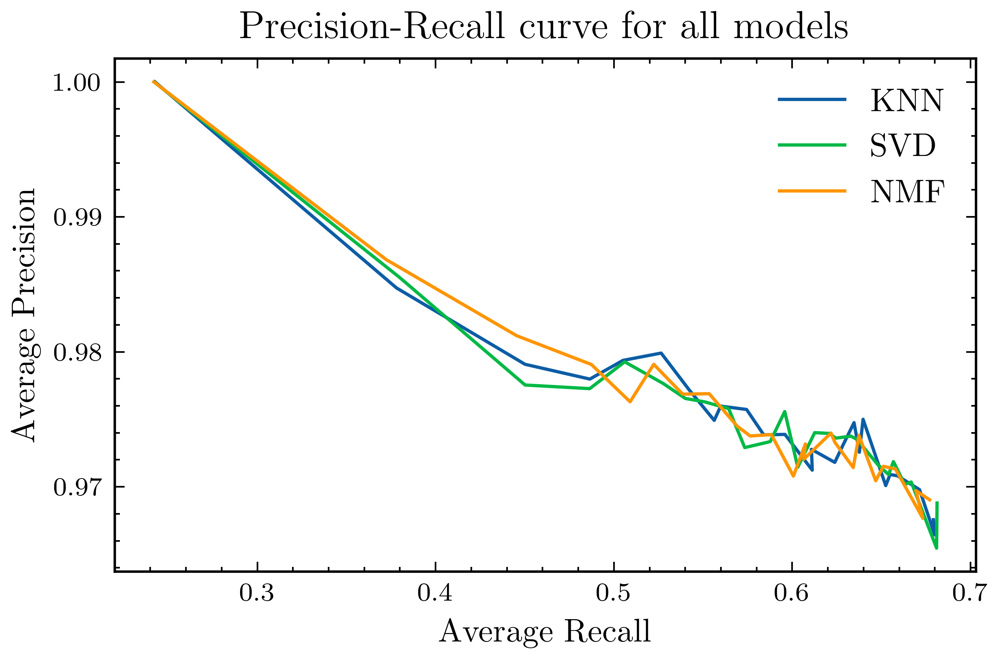

In [203]:
plt.figure(figsize=(4.5, 3), dpi=300)
plt.plot(knnRecall, knnPrecision, label='KNN')
plt.plot(SVDRecall, SVDPrecision, label='SVD')
plt.plot(NMFRecall, NMFPrecision, label='NMF')
plt.xlabel('Average Recall')
plt.ylabel('Average Precision')
plt.title('Precision-Recall curve for all models')
plt.xticks(size=8)
plt.yticks(size=8)
plt.legend()
plt.tight_layout()
plt.savefig('Q14_4.pdf', dpi=500, bbox_inches='tight')
plt.show()

In [222]:
genr = movieInfo['genres'].apply(lambda x: x.split('|')[0])
len(genr.unique())

19